

```
Practica 9: Transformada de fourier de tiempo corto-espectrogramas. 
Laboratorio: Procesamiento Digital de señales
Harold Adrián Gómez Gil
```

In [40]:
import numpy as np
from matplotlib.pylab import *
from scipy.signal import kaiserord, lfilter, firwin, freqz

#from scipy import *
import scipy.signal as signal
#from ztrans import *
from scipy.io.wavfile import read # libreria para lectura de archivos de audio
from IPython.display import Audio
%matplotlib inline

def choose_windows(name='Hamming', N=20):
    # Rect/Hanning/Hamming
    if name == 'Hamming':
        window = np.array([0.54 - 0.46 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
    elif name == 'Hanning':
        window = np.array([0.5 - 0.5 * np.cos(2 * np.pi * n / (N - 1)) for n in range(N)])
    elif name == 'Rect':
        window = np.ones(N)
    elif name == 'black':
        window = np.array([0.42-0.5*np.cos((2*np.pi*n)/(N-1))+0.08*np.cos((4*np.pi*n)/(N-1))for n in range(N)])
    return window

<h1>1.1 Procedimiento</h1>

<p>Filtros a diseñar</p>

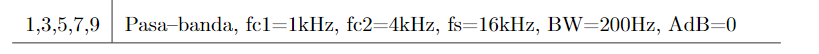

<h2>Consideraciones del diseño Pasa-banda</h2>

In [41]:
fc1=1e3
fc2=4e3
fs=16e3
BW=200
Adb=0
N=512 #puntos de la FFT

wc1 = 2*np.pi*fc1/fs # frecuencia de corte normalizada en radianes
wc2 = 2*np.pi*fc2/fs # frecuencia de corte normalizada en radianes

bwn=BW/fs # ancho de banda  normalizado en radianes

M=int(4/bwn) # orden estimado del filtro
print('Orden del filtro: ', M)

n = np.arange(-M,M)


Orden del filtro:  320


<h2>Diseño del filtro</h2>

In [42]:
h1 = - (wc1)/np.pi * np.sinc(wc1*(n)/np.pi) + (wc2)/np.pi * np.sinc(wc2*(n)/np.pi)  # Respuesta del filtro ideal 

h1[n==0]=(wc2-wc1)/np.pi # cuando es pasa-banda

w1,Hh1 = signal.freqz(h1,1,whole=True, worN=N) # Respuesta en frecuencia del filtro ideal


win2 = choose_windows(name='Hamming', N=len(n))

h2=h1*win2 # Multiplico la respuesta ideal por la ventana

A=np.sqrt(10**(0.1*Adb))
h2=h2*A # Ganancia del filtro
w2,Hh2 = signal.freqz(h2,1,whole=True, worN=N) # Respuesta en frecuencia del filtro enventanado





Text(0, 0.5, '$|H2(\\omega)| $')

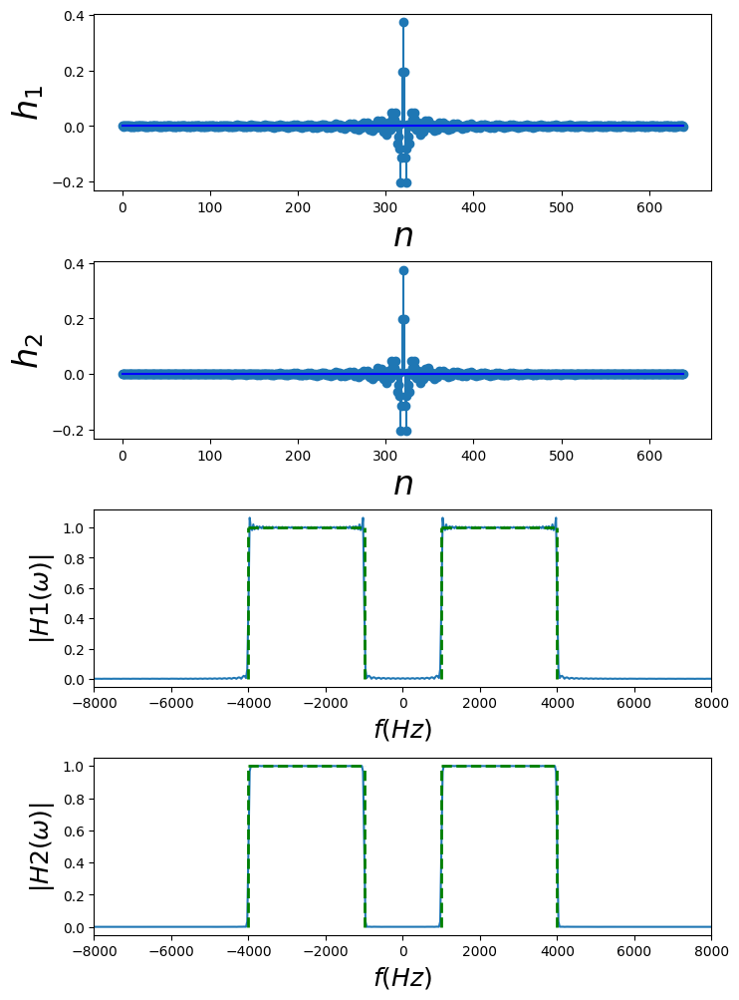

In [43]:
fig1,axs1 = subplots(4,1)
fig1.set_size_inches((8,12))
subplots_adjust(hspace=0.4)

ax=axs1[0]
ax.stem(n+M,h1,basefmt='b-')
ax.set_xlabel("$n$",fontsize=24)
ax.set_ylabel("$h_1$",fontsize=24)


ax=axs1[1]
ax.stem(n+M,h2,basefmt='b-')
ax.set_xlabel("$n$",fontsize=24)
ax.set_ylabel("$h_2$",fontsize=24)

ax=axs1[2]
ax.plot((w1-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh1)))
ax.axis(xmax=fs/2,xmin=-fs/2)
ax.vlines([-fc1,fc1],0,1,color='g',lw=2.,linestyle='--')
ax.vlines([-fc2,fc2],0,1,color='g',lw=2.,linestyle='--')
ax.hlines(1,-fc2,-fc1,color='g',lw=2.,linestyle='--')
ax.hlines(1,fc1,fc2,color='g',lw=2.,linestyle='--')
ax.set_xlabel(r"$f (Hz)$",fontsize=18)
ax.set_ylabel(r"$|H1(\omega)| $",fontsize=18)

ax=axs1[3]
ax.plot((w2-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh2)))
ax.axis(xmax=fs/2,xmin=-fs/2)
ax.vlines([-fc1,fc1],0,1,color='g',lw=2.,linestyle='--')
ax.vlines([-fc2,fc2],0,1,color='g',lw=2.,linestyle='--')
ax.hlines(1,-fc2,-fc1,color='g',lw=2.,linestyle='--')
ax.hlines(1,fc1,fc2,color='g',lw=2.,linestyle='--')
ax.set_xlabel(r"$f (Hz)$",fontsize=18)
ax.set_ylabel(r"$|H2(\omega)| $",fontsize=18)

<p>En base a lo que se puede ver, graficamente se tiene un sistema anticausal, en donde para volverse causal, como se tiene una simetria en los ejes, es posible ver el como al desplazar la señal con respecto al origen, se puede volver causal y graficamente se ve su representación en pasabandas</p>
<p>Por otro lado, una vez se enventana la grafica, con Hamming, el rizado en la grafica disminuye enormemente al punto de no aparecer esto en la respuesta en frecuencia, en la respuesta al impulso también se espera que este fenomeno ocurra con las muestras en donde estarán más cercanas al cero a medida que aumentan las mismas.</p>

<h1>Filtrado de musica con FIR</h1>

<p>1.Audio y grafico</p>

C:\Users\Asus\AppData\Local\Temp\ipykernel_23780\1620710394.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs ,x =  read(audio) # leo el archivo


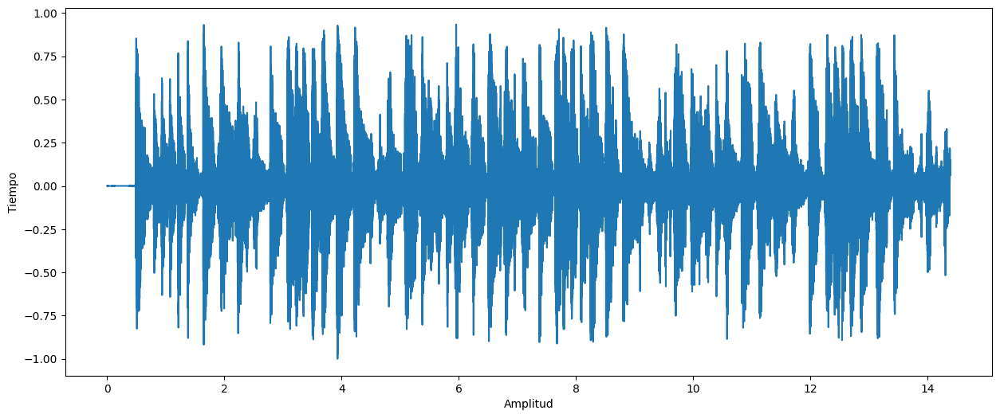

In [44]:
audio =('audio4.wav')
fs ,x =  read(audio) # leo el archivo
x = x/float(max(abs(x)))  # normalizo entre 0 y 1
time = np.arange(0,float(len(x))/fs, 1.0/fs) # vector de tiempo

plt.figure(figsize=(15,6))
plt.plot(time,x)
plt.ylabel("Tiempo")
plt.xlabel("Amplitud")
plt.show()
Audio(x, rate=fs) # para escuchar la senal, si se desea

<p>2. En el audio se identifican instrumentos de cuerda, en lo que parece ser un  tiple, una guitarra, un bajo electrico y una carrasca</p>

<p>3. Diseño de filtro FIR Pasabajas</p>

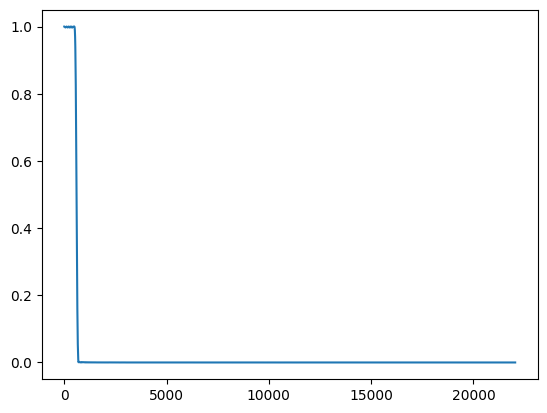

In [45]:
nyq_rate = fs / 2.0  # frecuencia de muestreso FS <= 2*fax
roll_off = 200.0  # Banda de transicion
cutoff_hz = 600.0 #frecuencia de corte
width = roll_off/nyq_rate
ripple_db = 60.0 #The desired attenuation in the stop band, in dB.
N,_ = kaiserord(ripple_db, width) # Compute the order and Kaiser parameter for the FIR filter.
taps = firwin(N, cutoff_hz/nyq_rate, pass_zero=True)
w, h = signal.freqz(taps, [1], worN=2000)
plt.plot(nyq_rate*w/np.pi, np.abs(h))

In [46]:
filteredx = lfilter(taps, 1.0, x)
Audio(filteredx, rate=fs) 

<p>5. Según lo que se aprecia en el audio una vez se ha hecho el proceso de filtrado, se resalta mucho más el sonido de los graves, como es el bajo, pero aún se siguen pasando los remanentes de sonido del tiple</p>

<p>Filtrado con frecuencua de corte en 200 Hz</p>

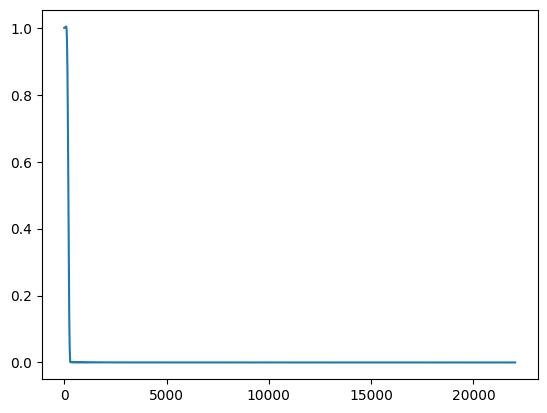

In [47]:
nyq_rate = fs / 2.0  # frecuencia de muestreso FS <= 2*fax
roll_off = 200.0  # Banda de transicion
cutoff_hz = 200.0 #frecuencia de corte
width = roll_off/nyq_rate
ripple_db = 60.0 #The desired attenuation in the stop band, in dB.
N,_ = kaiserord(ripple_db, width) # Compute the order and Kaiser parameter for the FIR filter.
taps = firwin(N, cutoff_hz/nyq_rate, pass_zero=True)
w, h = signal.freqz(taps, [1], worN=2000)
plt.plot(nyq_rate*w/np.pi, np.abs(h))
filteredx = lfilter(taps, 1.0, x)
Audio(filteredx, rate=fs) 

<p>Con esta frecuencia de corte unicamente se está distinguiendo lo que corresponde a los bajos de la canción y se escucha al comienzo algo parecido como a unos tambores</p>

<p>Filtrado con frecuencua de corte en 5000 Hz</p>

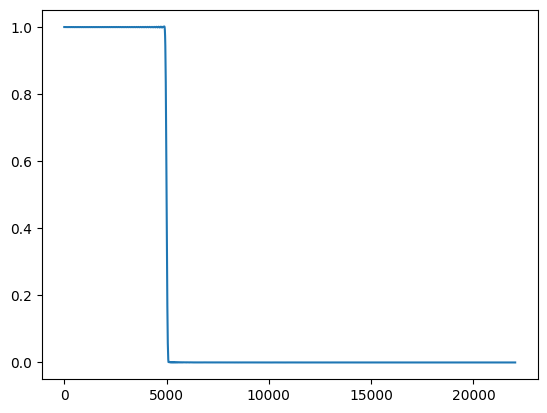

In [48]:
nyq_rate = fs / 2.0  # frecuencia de muestreso FS <= 2*fax
roll_off = 200.0  # Banda de transicion
cutoff_hz = 5000.0 #frecuencia de corte
width = roll_off/nyq_rate
ripple_db = 60.0 #The desired attenuation in the stop band, in dB.
N,_ = kaiserord(ripple_db, width) # Compute the order and Kaiser parameter for the FIR filter.
taps = firwin(N, cutoff_hz/nyq_rate, pass_zero=True)
w, h = signal.freqz(taps, [1], worN=2000)
plt.plot(nyq_rate*w/np.pi, np.abs(h))
filteredx = lfilter(taps, 1.0, x)
Audio(filteredx, rate=fs)

<p>En este punto, cuando se está usando una frecuencia de corte mucho más alta, se comienzan a distinguir o a resaltar los sonidos más agudos, en este caso como el tiple o requinto , pero además se conserva la parte de los bajos.</p>

<p>Filtrado con frecuencua de corte en 12000 Hz</p>

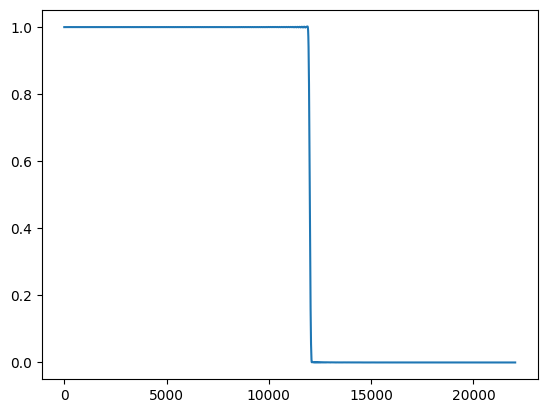

In [49]:
nyq_rate = fs / 2.0  # frecuencia de muestreso FS <= 2*fax
roll_off = 200.0  # Banda de transicion
cutoff_hz = 12000.0 #frecuencia de corte
width = roll_off/nyq_rate
ripple_db = 60.0 #The desired attenuation in the stop band, in dB.
N,_ = kaiserord(ripple_db, width) # Compute the order and Kaiser parameter for the FIR filter.
taps = firwin(N, cutoff_hz/nyq_rate, pass_zero=True)
w, h = signal.freqz(taps, [1], worN=2000)
plt.plot(nyq_rate*w/np.pi, np.abs(h))
filteredx = lfilter(taps, 1.0, x)
Audio(filteredx, rate=fs)

<p>Filtrado con frecuencia de corte en 20000</p>

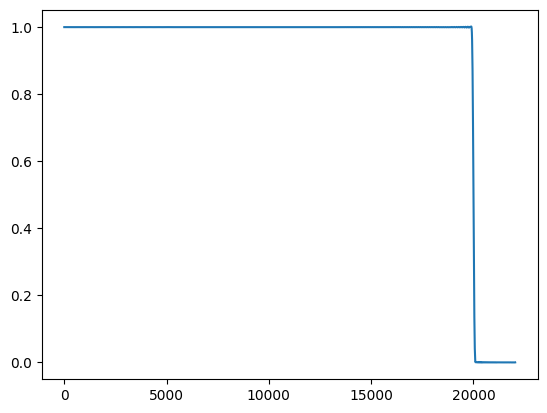

In [50]:
nyq_rate = fs / 2.0  # frecuencia de muestreso FS <= 2*fax
roll_off = 200.0  # Banda de transicion
cutoff_hz = 20000.0 #frecuencia de corte
width = roll_off/nyq_rate
ripple_db = 60.0 #The desired attenuation in the stop band, in dB.
N,_ = kaiserord(ripple_db, width) # Compute the order and Kaiser parameter for the FIR filter.
taps = firwin(N, cutoff_hz/nyq_rate, pass_zero=True)
w, h = signal.freqz(taps, [1], worN=2000)
plt.plot(nyq_rate*w/np.pi, np.abs(h))
filteredx = lfilter(taps, 1.0, x)
Audio(filteredx, rate=fs)

<p>En este punto, a medida que va aumentando la frecuencia de corte, se observa que el la pista comienza a sonar en conjunto con todos los instrumentos, esto debido a que se acerca al limite de frecuencia maxima que es audible para el ser humano.</p>



```
Conclusiones
```

<p>
<li> Según sea la frecuencia de corte del filtro, este permitirá filtrar mejor las bajas, las medias o las altas frecuencias, donde musicalmente se asocian al comportamiento de ciertos instrumentos, lo cual hace que se pueda separar los sonidos, sin embargo, es posible que queden remanentes del sonido que se está tratando de separar, tal y como ocurre cuando se trabaja con la frecuencia de corte de 200 hz, donde se notaba de forma muy sutil el sonido de tiple, que tiene un sonido mucho más grave.</li>
<li> Los filtros FIR son muy usados e importantes gracias a su versatilidad, facilidad de diseño y estabilidad, en donde gracias a su control de la respuesta en frecuencia es posible diseñar filtros muy especificos como se vió en el desarrollo de la guia, con el hecho de separar sonidos, esto es útil si se quieren eliminar o atenuar ciertas frecuencias, como la eliminación de ruido, ecualizaciones de audio o demodulaciones de señales de comunicación</li>

<li>El diseño de filtros pasabanda, permiten el paso de señales en frecuencias deseadas, mientras atenuan o bloquean las no deseadas. Este tipo de filtros desempeñan papeles fundamentales en distintos campos, como pueden ser las comunicaciones inalambricas, investigaciones biomedicas(procesamiento de imagenes medicas, etc), aplicaciones en procesamiento de audio y musica. </li>

</p>